_Please note that this notebook is merely a demo for visualization purposes. Our official implementation can be run using main.py._

_The following code requires having uploaded the dinov2 folder within the DINOv2 GitHub repository to your My Drive folder on Google Drive. The repository is available at https://github.com/facebookresearch/dinov2. There are further instructions below._

_Run the following block and follow the instructions in the pop-up window to mount your Google Drive files to the runtime._

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


_The next two blocks require some time to run (1-3 minutes total). Run them, and while they are running, do the following:_

_First, create a directory called datasets within the /content directory of your runtime. If you click on the Files tab to the left, you should be brought to the /content directory by default (you should see directories called .config and sample\_data). Within the datasets directory, upload whatever folders of data (images and depth maps) you would like to use. The images and depth maps should not be uploaded directly inside the datasets directory, but rather inside directories within the datasets directory (for example, your file system could look like /content/datasets/basement\_0001a\_out/1.png, /content/datasets/basement\_0001a\_out/1.jpg, /content/datasets/basement\_0001a\_out/2.png, etc.)_

_Second, upload the desired model file to the /content directory. The model files are found within the models directory of our GitHub repository._

In [2]:
!pip install mmcv==1.5.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 530.7/530.7 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 24.5 MB/s eta 0:00:00
  Created wheel for mmcv: filename=mmcv-1.5.0-py2.py3-none-any.whl size=807159 sha256=940662a613c6226c311aa46c2a36e9a017898d2be4e6cf75bb183e9236e2eb3a
  Stored in directory: /root/.cache/pip/wheels/20/5f/a9/54775baf3e918cd5f286a769399f29d40ed5ae2a9a52811138
Successfully built mmcv


In [3]:
import shutil

# Define the source and destination path
source_folder_path = '/content/gdrive/My Drive/dinov2'
destination_folder_path = '/content/dinov2'

# Copy the folder
shutil.copytree(source_folder_path, destination_folder_path)

'/content/dinov2'

_Do not proceed to the next steps until all of the data (images and depth maps) as well as the model file have finished uploading to the runtime. Once this has completed, run the next 4 blocks._

In [4]:
import os
from PIL import Image
import numpy as np
import torch
import torch.nn as nn
import torch.nn.init as init
import torch.nn.functional as F
import matplotlib
import matplotlib.pyplot as plt
from pathlib import Path
import sys
import math
import itertools
from functools import partial
import mmcv
from mmcv.runner import load_checkpoint
from collections import defaultdict
import cv2
import requests
from torchvision import transforms
from dinov2.eval.depth.models import build_depther
import urllib
import json
import random


class CenterPadding(torch.nn.Module):
    def __init__(self, multiple):
        super().__init__()
        self.multiple = multiple

    def _get_pad(self, size):
        new_size = math.ceil(size / self.multiple) * self.multiple
        pad_size = new_size - size
        pad_size_left = pad_size // 2
        pad_size_right = pad_size - pad_size_left
        return pad_size_left, pad_size_right

    #@torch.inference_mode()
    def forward(self, x):
        pads = list(itertools.chain.from_iterable(self._get_pad(m) for m in x.shape[:1:-1]))
        output = F.pad(x, pads)
        return output


def create_depther(cfg, backbone_model, backbone_size, head_type):
    train_cfg = cfg.get("train_cfg")
    test_cfg = cfg.get("test_cfg")
    depther = build_depther(cfg.model, train_cfg=train_cfg, test_cfg=test_cfg)

    depther.backbone.forward = partial(
        backbone_model.get_intermediate_layers,
        n=cfg.model.backbone.out_indices,
        reshape=True,
        return_class_token=cfg.model.backbone.output_cls_token,
        norm=cfg.model.backbone.final_norm,
    )

    if hasattr(backbone_model, "patch_size"):
        depther.backbone.register_forward_pre_hook(lambda _, x: CenterPadding(backbone_model.patch_size)(x[0]))

    return depther


def make_depth_transform() -> transforms.Compose:
    return transforms.Compose([
        transforms.ToTensor(),
        lambda x: 255.0 * x[:3], # Discard alpha component and scale by 255
        transforms.Normalize(
            mean=(123.675, 116.28, 103.53),
            std=(58.395, 57.12, 57.375),
        ),
    ])


def render_depth(values, colormap_name="magma_r") -> Image:
    min_value, max_value = values.min(), values.max()
    normalized_values = (values - min_value) / (max_value - min_value)

    colormap = matplotlib.colormaps[colormap_name]
    colors = colormap(normalized_values, bytes=True) # ((1)xhxwx4)
    colors = colors[:, :, :3] # Discard alpha component
    return Image.fromarray(colors)


def load_config_from_url(url: str) -> str:
    with urllib.request.urlopen(url) as f:
        return f.read().decode()


def load_backbone(backbone_size = "small"):

    backbone_archs = {
        "small": "vits14",
        "base": "vitb14",
        "large": "vitl14",
        "giant": "vitg14",
    }
    backbone_arch = backbone_archs[backbone_size]
    backbone_name = f"dinov2_{backbone_arch}"

    backbone_model = torch.hub.load(repo_or_dir="facebookresearch/dinov2", model=backbone_name)
    backbone_model.eval()
    backbone_model.cuda()

    return backbone_name, backbone_model


def load_dino_model(backbone_name, backbone_model, backbone_size = "small", head_dataset = "nyu", head_type = "dpt"):

    DINOV2_BASE_URL = "https://dl.fbaipublicfiles.com/dinov2"
    head_config_url = f"{DINOV2_BASE_URL}/{backbone_name}/{backbone_name}_{head_dataset}_{head_type}_config.py"
    head_checkpoint_url = f"{DINOV2_BASE_URL}/{backbone_name}/{backbone_name}_{head_dataset}_{head_type}_head.pth"

    cfg_str = load_config_from_url(head_config_url)
    cfg = mmcv.Config.fromstring(cfg_str, file_format=".py")

    model = create_depther(
        cfg,
        backbone_model=backbone_model,
        backbone_size=backbone_size,
        head_type=head_type,
    )

    load_checkpoint(model, head_checkpoint_url, map_location="cpu")
    model.eval()
    model.cuda()

    return model


def enumerate_datasets(data_directory):

    datasets = []
    num_images_dataset = []

    for dataset_dir, _, files in os.walk(data_directory):
        if dataset_dir != data_directory:
            dataset_name = os.path.basename(dataset_dir)
            datasets.append(dataset_name)

            image_count = sum(1 for file in files if file.endswith('.jpg'))
            num_images_dataset.append(image_count)

    num_images = sum(num_images_dataset)

    return datasets, num_images_dataset, num_images


def load_training_logs(num_epochs, num_val_checkpoints, model_string):

    original_train_file_path = './training_logs/original_mse_train_' + model_string + '.pt'
    if os.path.exists(original_train_file_path):
        original_mse_train = torch.load(original_train_file_path, weights_only=True)
    else:
        original_mse_train = torch.zeros(num_epochs)

    updated_train_file_path = './training_logs/updated_mse_train_' + model_string + '.pt'
    if os.path.exists(updated_train_file_path):
        updated_mse_train = torch.load(updated_train_file_path, weights_only=True)
    else:
        updated_mse_train = torch.zeros(num_epochs)

    original_val_file_path = './training_logs/original_mse_val_' + model_string + '.pt'
    if os.path.exists(original_val_file_path):
        original_mse_val = torch.load(original_val_file_path, weights_only=True)
    else:
        original_mse_val = torch.zeros(num_epochs, num_val_checkpoints + 1)

    updated_val_file_path = './training_logs/updated_mse_val_' + model_string + '.pt'
    if os.path.exists(updated_val_file_path):
        updated_mse_val = torch.load(updated_val_file_path, weights_only=True)
    else:
        updated_mse_val = torch.zeros(num_epochs, num_val_checkpoints + 1)

    return original_mse_train, updated_mse_train, original_mse_val, updated_mse_val

In [5]:
data_directory = './datasets'

datasets, num_images_dataset, num_images = enumerate_datasets(data_directory)

split_ratio = 0.0

filename_train = './train_list.json'
filename_val = './val_list.json'

train_list = []
val_list = []

num_images_train = 0
num_images_val = 0

for i in range(len(datasets)):
    for j in range(1, num_images_dataset[i]):
        train_choice = np.random.rand(1) < split_ratio
        if train_choice:
            train_list.append([datasets[i], j])
            num_images_train += 1
        else:
            val_list.append([datasets[i], j])
            num_images_val += 1

print("Num Images = " + str(num_images))
print("Num Images Train = " + str(num_images_train))
print("Num Images Val = " + str(num_images_val))

with open(filename_train, 'w') as f:
    json.dump(train_list, f)

with open(filename_val, 'w') as f:
    json.dump(val_list, f)

Num Images = 42
Num Images Train = 0
Num Images Val = 41


In [6]:
def forward_pass(selected_data, data_directory, transform, model, adapter_model, image_height, image_width, feature_height, feature_width, batch_size, model_string, image_index):

    ground_truth_depth = torch.zeros(batch_size, image_height, image_width)
    transformed_image_current = torch.zeros(batch_size, 3, image_height, image_width)
    grayscale_image_current = np.zeros((batch_size, image_height, image_width))

    for idx in range(batch_size):
        selected_dataset, selected_image = selected_data[idx]
        ground_truth_depth[idx] = 10.0 * torch.tensor(np.array(Image.open(data_directory + '/' + selected_dataset + '/' + str(selected_image+1) + '.png')).astype(float)/255.0, dtype=torch.float32)
        transformed_image_current[idx] = transform(Image.open(data_directory + '/' + selected_dataset + '/' + str(selected_image+1) + '.jpg'))
        grayscale_image_current[idx] = cv2.imread(data_directory + '/' + selected_dataset + '/' + str(selected_image+1) + '.jpg', 0)

    with torch.no_grad():
        original_dino_depth_map = model.whole_inference(transformed_image_current.cuda(), img_meta=None, rescale=True).squeeze()

    start = torch.cuda.Event(enable_timing=True)
    end = torch.cuda.Event(enable_timing=True)
    start.record()

    dino_features_current = model.extract_feat(transformed_image_current.cuda())

    original_mse = F.mse_loss(original_dino_depth_map.cpu(), ground_truth_depth.squeeze()).item()

    transformed_image_previous = torch.zeros(batch_size, 3, image_height, image_width)
    for idx in range(batch_size):
        selected_dataset, selected_image = selected_data[idx]
        transformed_image_previous[idx] = transform(Image.open(data_directory + '/' + selected_dataset + '/' + str(selected_image) + '.jpg'))

    with torch.no_grad():
        dino_features_previous = model.extract_feat(transformed_image_previous.cuda())

    shift_tensor_conv_x = torch.zeros(batch_size, 1, feature_height, feature_width).cuda()
    shift_tensor_conv_y = torch.zeros(batch_size, 1, feature_height, feature_width).cuda()
    shift_tensor_fc_x = torch.zeros(batch_size, 1).cuda()
    shift_tensor_fc_y = torch.zeros(batch_size, 1).cuda()

    for idx in range(batch_size):
        selected_dataset, selected_image = selected_data[idx]

        grayscale_image_previous = cv2.imread(data_directory + '/' + selected_dataset + '/' + str(selected_image) + '.jpg', 0)
        shift_x, shift_y = cv2.phaseCorrelate(np.float32(grayscale_image_previous), np.float32(grayscale_image_current[idx]))[0]

        shift_tensor_conv_x[idx] = shift_x * torch.ones(1, 1, feature_height, feature_width)
        shift_tensor_conv_y[idx] = shift_y * torch.ones(1, 1, feature_height, feature_width)
        shift_tensor_fc_x[idx] = shift_x * torch.ones(1, 1)
        shift_tensor_fc_y[idx] = shift_y * torch.ones(1, 1)

    dino_features_new = []
    for dpt_layer in range(4):
        adapter_input_image = torch.cat((dino_features_current[dpt_layer][0].detach().clone(), dino_features_previous[dpt_layer][0].detach().clone(), shift_tensor_conv_x, shift_tensor_conv_y), dim=1)
        adapter_input_fc = torch.cat((dino_features_current[dpt_layer][1].detach().clone(), dino_features_previous[dpt_layer][1].detach().clone(), shift_tensor_fc_x, shift_tensor_fc_y), dim=1)

        dino_features_new_x = []
        dino_features_new_x.append(adapter_model.forward_conv(adapter_input_image, dpt_layer))
        dino_features_new_x.append(adapter_model.forward_fc(adapter_input_fc, dpt_layer))
        dino_features_new.append(dino_features_new_x)

    updated_dino_depth_map = model._decode_head_forward_test(dino_features_new, img_metas=None)

    updated_dino_depth_map = torch.clamp(updated_dino_depth_map, min=model.decode_head.min_depth, max=model.decode_head.max_depth)

    updated_dino_depth_map = F.interpolate(updated_dino_depth_map, transformed_image_current.shape[2:], None, "bilinear", model.align_corners).squeeze()

    end.record()
    torch.cuda.synchronize()

    avg_milliseconds = start.elapsed_time(end)

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 4))

    im1 = ax1.imshow(Image.open(data_directory + '/' + selected_dataset + '/' + str(selected_image+1) + '.jpg'))
    ax1.axis('off')
    ax1.set_title("RGB Image")

    im2 = ax2.imshow(ground_truth_depth[0], cmap='viridis')
    ax2.axis('off')
    ax2.set_title("Ground Truth Depth Map")
    fig.colorbar(im2, ax=ax2, orientation='vertical', fraction=0.05, pad=0.05)

    im3 = ax3.imshow(original_dino_depth_map.detach().cpu().numpy(), cmap='viridis')
    ax3.axis('off')
    ax3.set_title("Original DINO Depth Map")
    fig.colorbar(im3, ax=ax3, orientation='vertical', fraction=0.05, pad=0.05)

    im4 = ax4.imshow(updated_dino_depth_map.detach().cpu().numpy(), cmap='viridis')
    ax4.axis('off')
    ax4.set_title("Our Depth Map")
    fig.colorbar(im4, ax=ax4, orientation='vertical', fraction=0.05, pad=0.05)

    plt.tight_layout()
    plt.show()

    print("Our Pipeline Inference Time for Image " + str(image_index) + " = " + str(avg_milliseconds) + " milliseconds (" + str(1000/avg_milliseconds) + " Hz)")
    inference_times_milliseconds.append(avg_milliseconds)

    loss = F.mse_loss(updated_dino_depth_map.cpu(), ground_truth_depth.squeeze())

    updated_mse = loss.item()

    if 'cnn_regularized' in model_string:
        lam = 0.1
        loss += lam * F.mse_loss(updated_dino_depth_map.cpu(), original_dino_depth_map.cpu())

    del ground_truth_depth, transformed_image_current, dino_features_current, original_dino_depth_map, grayscale_image_current
    del adapter_input_image, adapter_input_fc, dino_features_new, dino_features_new_x, updated_dino_depth_map
    del shift_tensor_conv_x, shift_tensor_conv_y, shift_tensor_fc_x, shift_tensor_fc_y, shift_x, shift_y, grayscale_image_previous
    del transformed_image_previous, dino_features_previous
    torch.cuda.empty_cache()

    return original_mse, updated_mse, loss


def val_loop(val_list, data_directory, transform, model, adapter_model, image_height, image_width, feature_height, feature_width, num_images_val, batch_size, epoch, model_string, end_of_epoch=False, training_percentage=None):
    num_batches_val = int(num_images_val/batch_size)
    original_mse_current_epoch_val_list = torch.zeros(num_batches_val)
    updated_mse_current_epoch_val_list = torch.zeros(num_batches_val)

    if end_of_epoch:
        index_string = 'End of Epoch ' + str(epoch)
    else:
        index_string = 'Epoch ' + str(epoch) + ', ' + str(training_percentage) + '% Training Completed'

    random.shuffle(val_list)
    for i in range(num_batches_val):
        selected_data = val_list[i*batch_size:i*batch_size+batch_size]

        original_mse, updated_mse, _ = forward_pass(selected_data, data_directory, transform, model, adapter_model, image_height, image_width, feature_height, feature_width, batch_size, model_string, i)

        original_mse_current_epoch_val_list[i] = original_mse

        updated_mse_current_epoch_val_list[i] = updated_mse

        print("Validation - " + index_string + ", Image " + str(i) + ": Original MSE = " + str(original_mse) + ", Updated MSE = " + str(updated_mse))

        del original_mse, updated_mse
        torch.cuda.empty_cache()

    original_mse_current_epoch_val_mean = original_mse_current_epoch_val_list.mean().item()
    updated_mse_current_epoch_val_mean = updated_mse_current_epoch_val_list.mean().item()
    difference_current_epoch_val_mean = updated_mse_current_epoch_val_mean - original_mse_current_epoch_val_mean

    print("\nValidation - " + index_string + ": Original DINO Mean MSE over Validation set at Epoch " + str(epoch) + " = " + str(original_mse_current_epoch_val_mean))
    print("Validation - " + index_string + ": Our Pipeline Mean MSE over Validation set at Epoch " + str(epoch) + " = " + str(updated_mse_current_epoch_val_mean))
    print("Validation - " + index_string + ": Mean Difference over Validation set at Epoch " + str(epoch) + " = " + str(difference_current_epoch_val_mean))

    return original_mse_current_epoch_val_mean, updated_mse_current_epoch_val_mean

In [7]:
class CNNModel(nn.Module):
    def __init__(self, num_layers, num_past_images, phase_correlation=True, past_images=True):
        super(CNNModel, self).__init__()
        self.num_layers = num_layers
        self.num_past_images = num_past_images
        if phase_correlation and num_past_images > 0:
            in_channels = (384 + 2) * self.num_past_images
        elif num_past_images > 0:
            in_channels = 384 * self.num_past_images
        else:
            in_channels = 384
        out_channels = 384
        self.convlist = []
        for i in range(self.num_layers):
            self.convlist.append(nn.ModuleList([
                nn.Conv2d(in_channels=in_channels, out_channels=in_channels, kernel_size=3, padding=1)
                for _ in range(4)
            ]).cuda())
        self.conv_out = nn.ModuleList([
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, padding=1)
            for _ in range(4)
        ]).cuda()
        self.fclist = []
        for i in range(self.num_layers):
            self.fclist.append(nn.ModuleList([
                nn.Linear(in_channels, in_channels)
                for _ in range(4)
            ]).cuda())
        self.fc_out = nn.ModuleList([
            nn.Linear(in_channels, out_channels)
            for _ in range(4)
        ]).cuda()
        self._initialize_weights()

    def _initialize_weights(self):
        # Initialize convolutional layers
        for layer_idx in range(len(self.convlist)):
            for i, conv in enumerate(self.convlist[layer_idx]):
                with torch.no_grad():
                    init.constant_(conv.bias, 0)
                    conv.weight.zero_()

        for i, conv in enumerate(self.conv_out):
            with torch.no_grad():
                init.constant_(conv.bias, 0)
                conv.weight.zero_()

        # Initialize fully connected layers
        for layer_idx in range(len(self.fclist)):
            for i, fc in enumerate(self.fclist[layer_idx]):
                with torch.no_grad():
                    init.constant_(fc.bias, 0)
                    fc.weight.zero_()

        for i, fc in enumerate(self.fc_out):
            with torch.no_grad():
                init.constant_(fc.bias, 0)
                fc.weight.zero_()

    def forward_conv(self, x, idx):
        for layer_idx in range(len(self.convlist)):
            if self.num_past_images > 0:
                x_out = self.convlist[layer_idx][idx](x[:, 384:])
            else:
                x_out = self.convlist[layer_idx][idx](x)
            x_out = torch.relu(x_out)
        x_out = self.conv_out[idx](x_out) + x[:, :384]
        return x_out

    def forward_fc(self, x, idx):
        for layer_idx in range(len(self.fclist)):
            if self.num_past_images > 0:
               x_out = self.fclist[layer_idx][idx](x[:, 384:])
            else:
               x_out = self.fclist[layer_idx][idx](x)
            x_out = torch.relu(x_out)
        x_out = self.fc_out[idx](x_out) + x[:, :384]
        return x_out

_Set the model string variable to the desired model type you would like to test (either 'cnn', 'cnn\_regularized'). Then you can run the following block, which will run validation on the data you uploaded and visualize the results._

_We show results below for only the first 40 images from the scene basement\_0001a\_out to ensure that the output is small enough that the notebook stays under 25 MB and can be uploaded to GitHub. Feel free to run this block with larger numbers of images._

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
/content/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/content/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/content/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth
100%|██████████| 84.2M/84.2M [00:00<00:00, 168MB/s]
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_nyu_dpt_head.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_nyu_dpt_head.pth


load checkpoint from http path: https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_nyu_dpt_head.pth


100%|██████████| 160M/160M [00:00<00:00, 232MB/s]


Running Validation for cnn_regularized


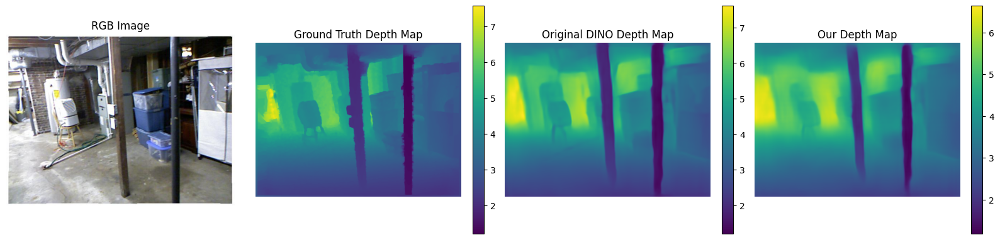

Our Pipeline Inference Time for Image 0 = 262.47802734375 milliseconds (3.8098427137688238 Hz)
Validation - End of Epoch 9, Image 0: Original MSE = 0.39329415559768677, Updated MSE = 0.20646542310714722


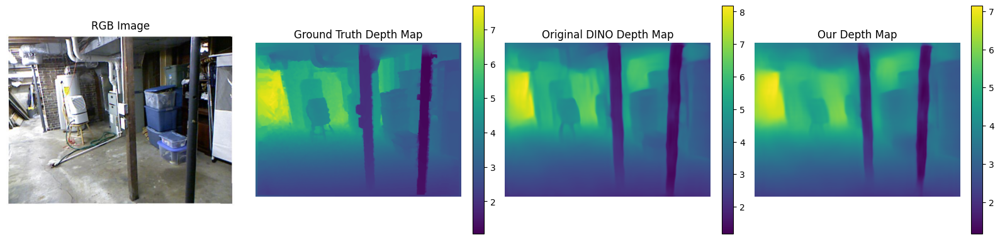

Our Pipeline Inference Time for Image 1 = 198.5638427734375 milliseconds (5.036163613840843 Hz)
Validation - End of Epoch 9, Image 1: Original MSE = 0.23416948318481445, Updated MSE = 0.16054658591747284


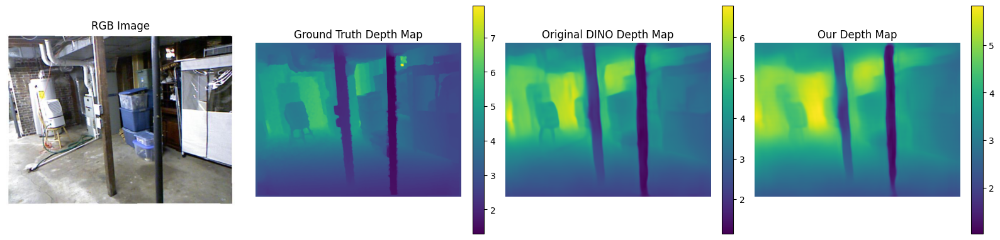

Our Pipeline Inference Time for Image 2 = 204.6814422607422 milliseconds (4.885640774047836 Hz)
Validation - End of Epoch 9, Image 2: Original MSE = 0.22130465507507324, Updated MSE = 0.12640482187271118


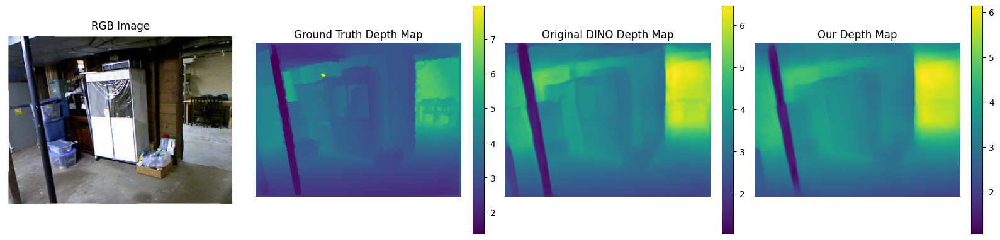

Our Pipeline Inference Time for Image 3 = 266.9383544921875 milliseconds (3.7461832785414395 Hz)
Validation - End of Epoch 9, Image 3: Original MSE = 0.17256706953048706, Updated MSE = 0.12599845230579376


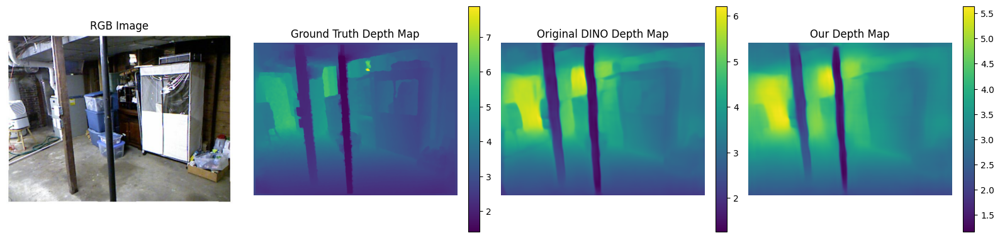

Our Pipeline Inference Time for Image 4 = 223.09738159179688 milliseconds (4.482347541979261 Hz)
Validation - End of Epoch 9, Image 4: Original MSE = 0.1718290001153946, Updated MSE = 0.1378217339515686


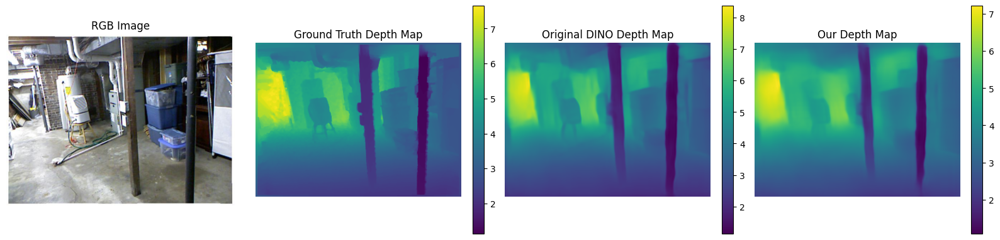

Our Pipeline Inference Time for Image 5 = 197.69775390625 milliseconds (5.058226409968262 Hz)
Validation - End of Epoch 9, Image 5: Original MSE = 0.20262958109378815, Updated MSE = 0.15736587345600128


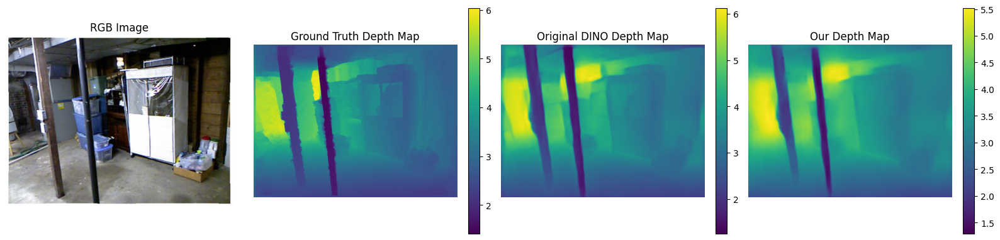

Our Pipeline Inference Time for Image 6 = 201.16806030273438 milliseconds (4.9709680477861005 Hz)
Validation - End of Epoch 9, Image 6: Original MSE = 0.21508890390396118, Updated MSE = 0.1465238779783249


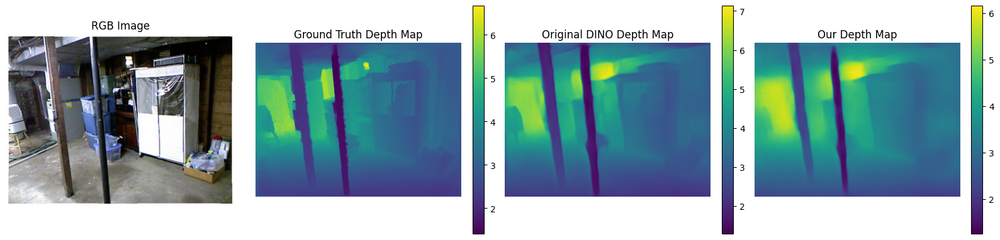

Our Pipeline Inference Time for Image 7 = 205.2969207763672 milliseconds (4.870993662341941 Hz)
Validation - End of Epoch 9, Image 7: Original MSE = 0.2485518902540207, Updated MSE = 0.14266668260097504


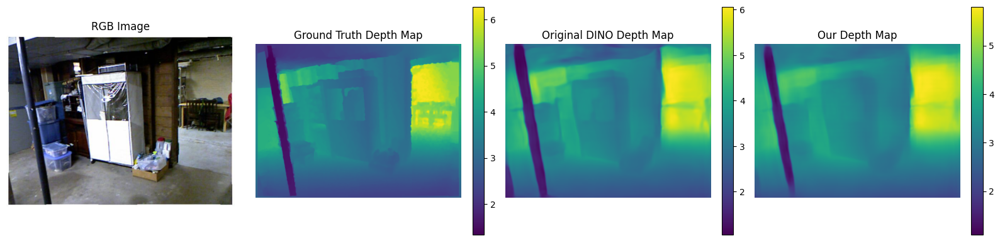

Our Pipeline Inference Time for Image 8 = 206.2943115234375 milliseconds (4.847443405565684 Hz)
Validation - End of Epoch 9, Image 8: Original MSE = 0.14880973100662231, Updated MSE = 0.11767196655273438


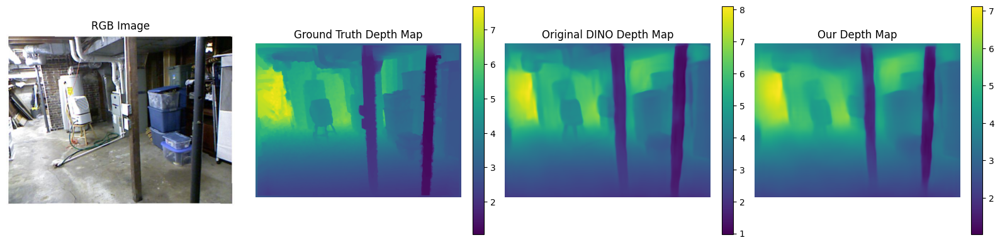

Our Pipeline Inference Time for Image 9 = 204.1589813232422 milliseconds (4.898143562034694 Hz)
Validation - End of Epoch 9, Image 9: Original MSE = 0.2813996374607086, Updated MSE = 0.19642755389213562


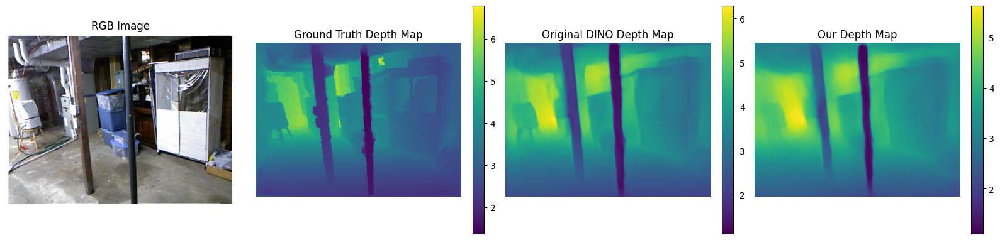

Our Pipeline Inference Time for Image 10 = 209.9811248779297 milliseconds (4.7623328076813545 Hz)
Validation - End of Epoch 9, Image 10: Original MSE = 0.20534655451774597, Updated MSE = 0.14592613279819489


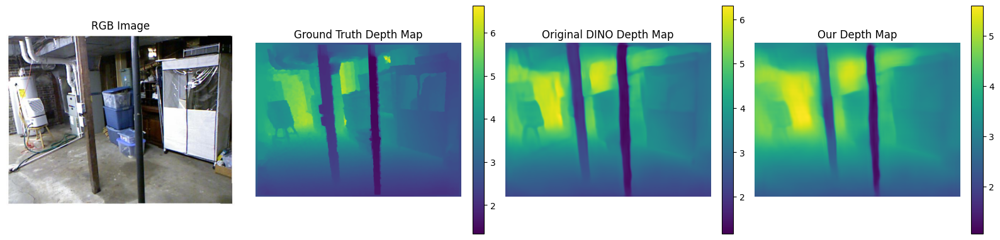

Our Pipeline Inference Time for Image 11 = 195.95260620117188 milliseconds (5.103274814183204 Hz)
Validation - End of Epoch 9, Image 11: Original MSE = 0.21689224243164062, Updated MSE = 0.13410137593746185


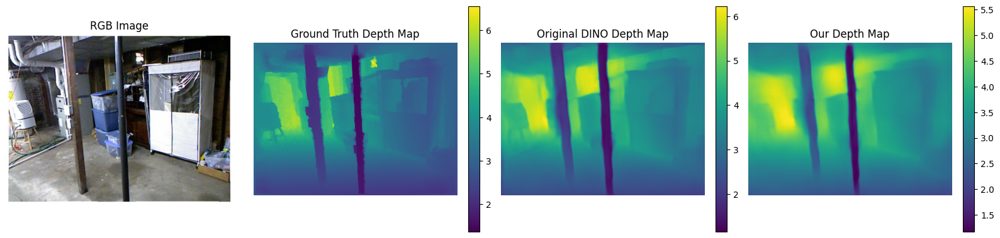

Our Pipeline Inference Time for Image 12 = 200.98899841308594 milliseconds (4.975396702782376 Hz)
Validation - End of Epoch 9, Image 12: Original MSE = 0.21820279955863953, Updated MSE = 0.1473444700241089


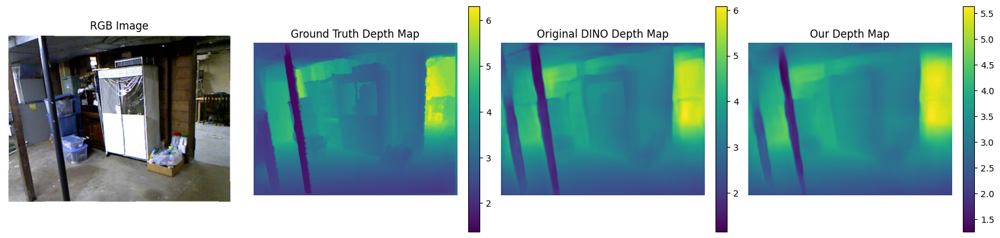

Our Pipeline Inference Time for Image 13 = 199.43423461914062 milliseconds (5.014184259335911 Hz)
Validation - End of Epoch 9, Image 13: Original MSE = 0.13269437849521637, Updated MSE = 0.10981322079896927


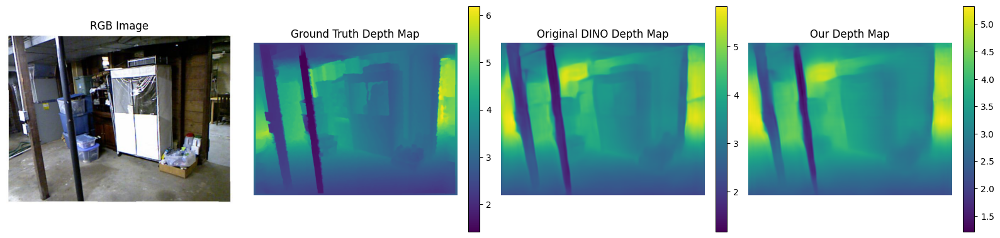

Our Pipeline Inference Time for Image 14 = 198.84442138671875 milliseconds (5.029057355625628 Hz)
Validation - End of Epoch 9, Image 14: Original MSE = 0.1816309541463852, Updated MSE = 0.1355878710746765


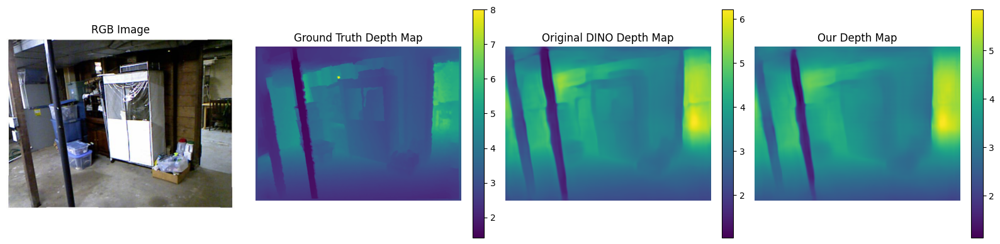

Our Pipeline Inference Time for Image 15 = 200.92568969726562 milliseconds (4.976964376763858 Hz)
Validation - End of Epoch 9, Image 15: Original MSE = 0.20835956931114197, Updated MSE = 0.17217527329921722


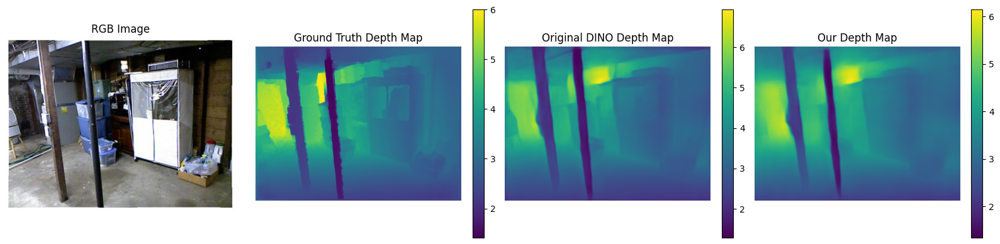

Our Pipeline Inference Time for Image 16 = 202.47683715820312 milliseconds (4.938836530810982 Hz)
Validation - End of Epoch 9, Image 16: Original MSE = 0.23928862810134888, Updated MSE = 0.16518178582191467


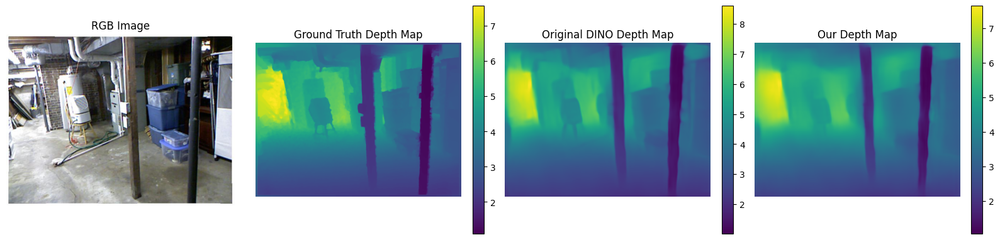

Our Pipeline Inference Time for Image 17 = 199.73529052734375 milliseconds (5.006626507312688 Hz)
Validation - End of Epoch 9, Image 17: Original MSE = 0.25051626563072205, Updated MSE = 0.16365139186382294


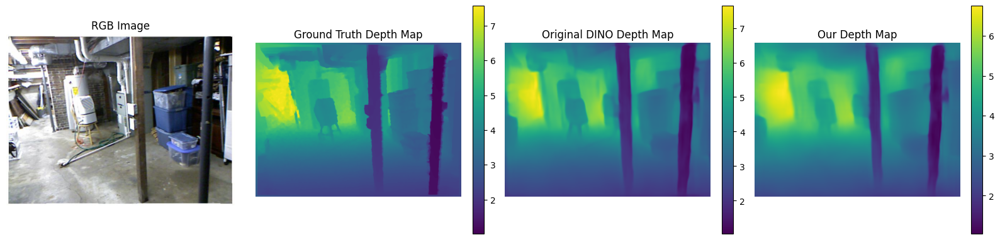

Our Pipeline Inference Time for Image 18 = 204.90252685546875 milliseconds (4.880369292397091 Hz)
Validation - End of Epoch 9, Image 18: Original MSE = 0.219957172870636, Updated MSE = 0.2083451896905899


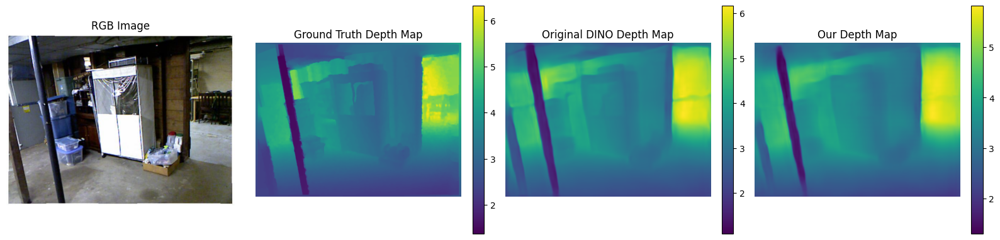

Our Pipeline Inference Time for Image 19 = 199.78445434570312 milliseconds (5.0053944551142076 Hz)
Validation - End of Epoch 9, Image 19: Original MSE = 0.11988844722509384, Updated MSE = 0.08309782296419144


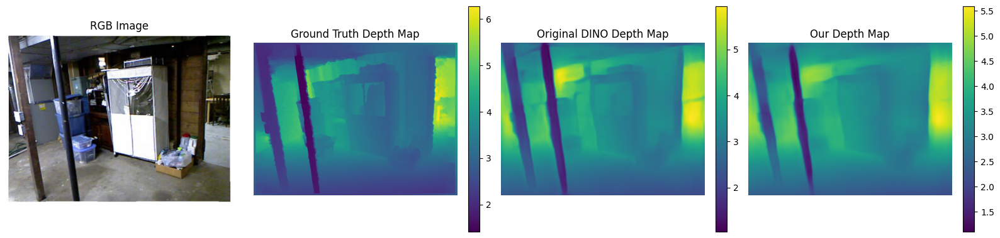

Our Pipeline Inference Time for Image 20 = 208.743896484375 milliseconds (4.79055922995503 Hz)
Validation - End of Epoch 9, Image 20: Original MSE = 0.1825307160615921, Updated MSE = 0.14877727627754211


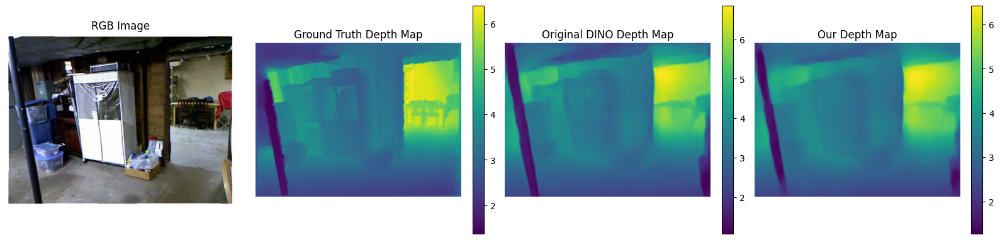

Our Pipeline Inference Time for Image 21 = 202.0740509033203 milliseconds (4.948680919344943 Hz)
Validation - End of Epoch 9, Image 21: Original MSE = 0.28793951869010925, Updated MSE = 0.19943417608737946


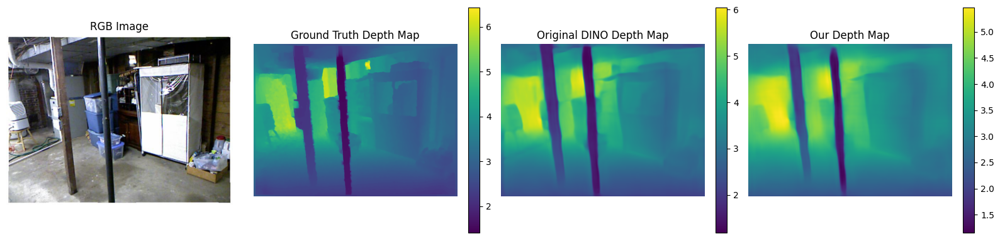

Our Pipeline Inference Time for Image 22 = 206.12261962890625 milliseconds (4.851481131960938 Hz)
Validation - End of Epoch 9, Image 22: Original MSE = 0.15858399868011475, Updated MSE = 0.1181274801492691


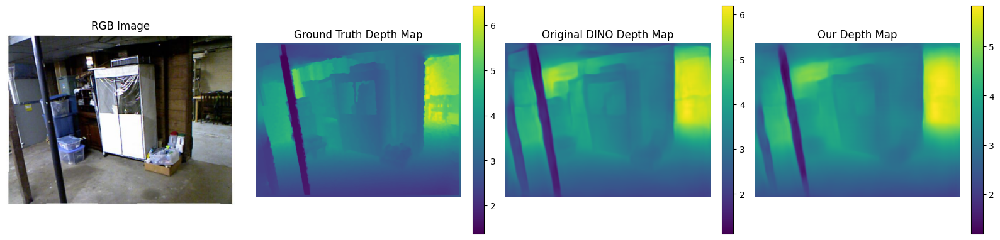

Our Pipeline Inference Time for Image 23 = 213.1578826904297 milliseconds (4.691358289818938 Hz)
Validation - End of Epoch 9, Image 23: Original MSE = 0.14205074310302734, Updated MSE = 0.09427409619092941


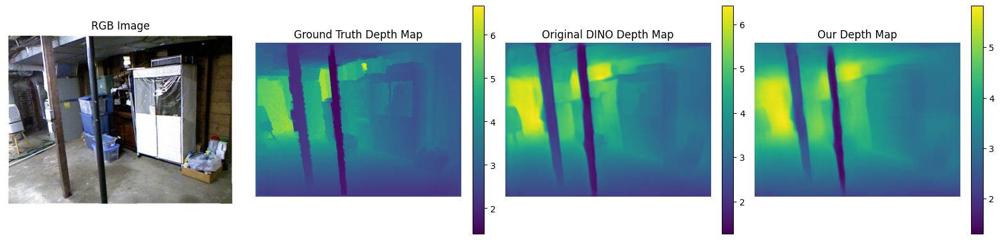

Our Pipeline Inference Time for Image 24 = 202.67507934570312 milliseconds (4.9340057160865785 Hz)
Validation - End of Epoch 9, Image 24: Original MSE = 0.27298468351364136, Updated MSE = 0.17844706773757935


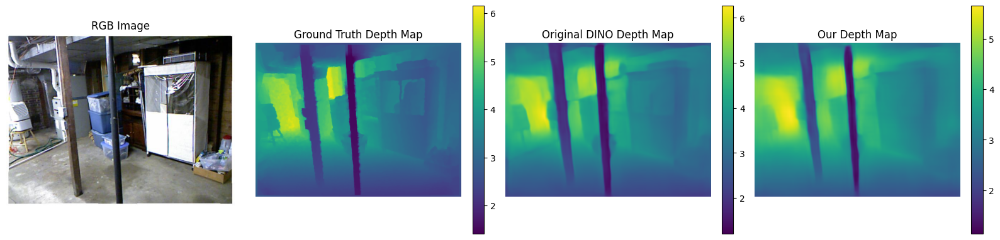

Our Pipeline Inference Time for Image 25 = 206.561767578125 milliseconds (4.841166938706524 Hz)
Validation - End of Epoch 9, Image 25: Original MSE = 0.15969640016555786, Updated MSE = 0.11751023679971695


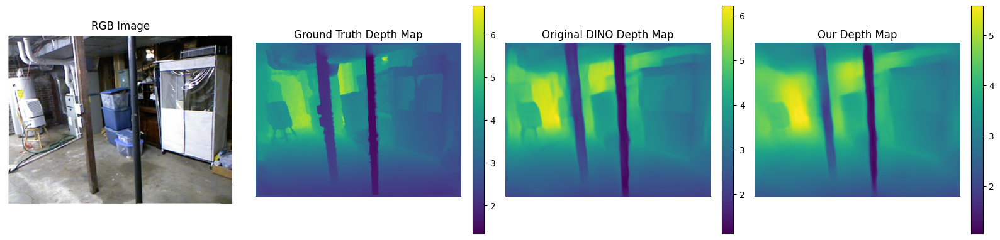

Our Pipeline Inference Time for Image 26 = 208.77926635742188 milliseconds (4.789747648064053 Hz)
Validation - End of Epoch 9, Image 26: Original MSE = 0.17036095261573792, Updated MSE = 0.11396021395921707


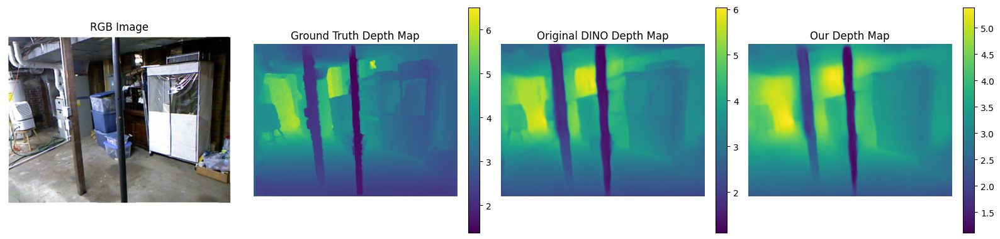

Our Pipeline Inference Time for Image 27 = 203.36236572265625 milliseconds (4.917330679383377 Hz)
Validation - End of Epoch 9, Image 27: Original MSE = 0.14825411140918732, Updated MSE = 0.10822635889053345


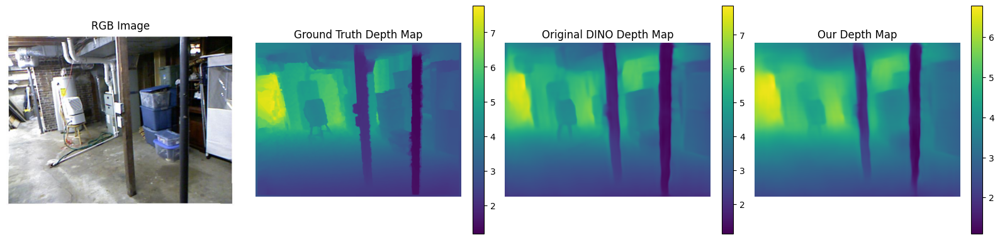

Our Pipeline Inference Time for Image 28 = 199.84588623046875 milliseconds (5.003855815409518 Hz)
Validation - End of Epoch 9, Image 28: Original MSE = 0.22098831832408905, Updated MSE = 0.16896626353263855


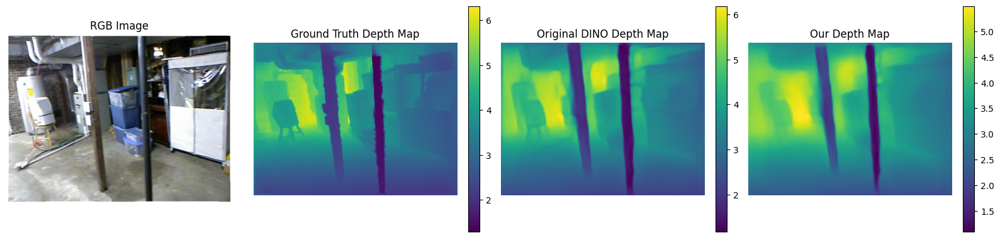

Our Pipeline Inference Time for Image 29 = 203.9931182861328 milliseconds (4.902126152105488 Hz)
Validation - End of Epoch 9, Image 29: Original MSE = 0.15671487152576447, Updated MSE = 0.10021154582500458


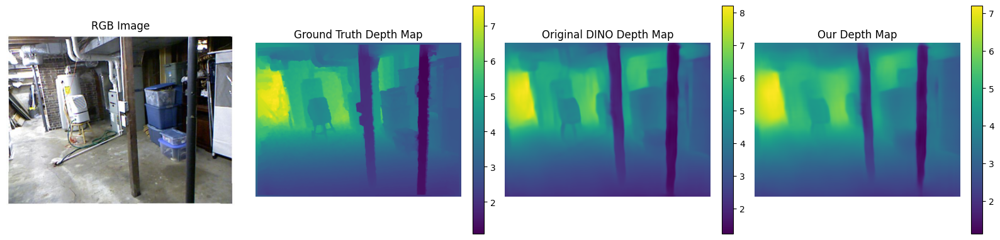

Our Pipeline Inference Time for Image 30 = 207.97059631347656 milliseconds (4.808372037808114 Hz)
Validation - End of Epoch 9, Image 30: Original MSE = 0.22712865471839905, Updated MSE = 0.14660310745239258


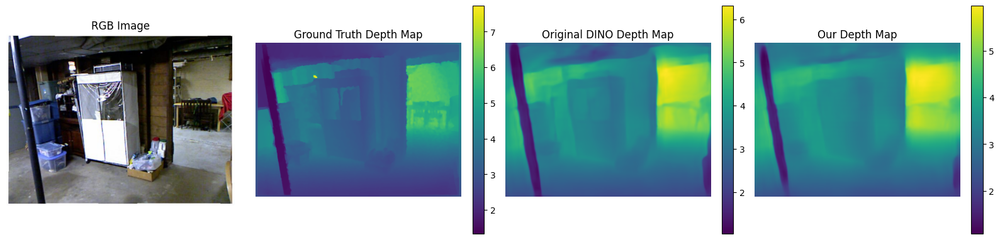

Our Pipeline Inference Time for Image 31 = 206.75730895996094 milliseconds (4.836588389693408 Hz)
Validation - End of Epoch 9, Image 31: Original MSE = 0.1926172822713852, Updated MSE = 0.17181695997714996


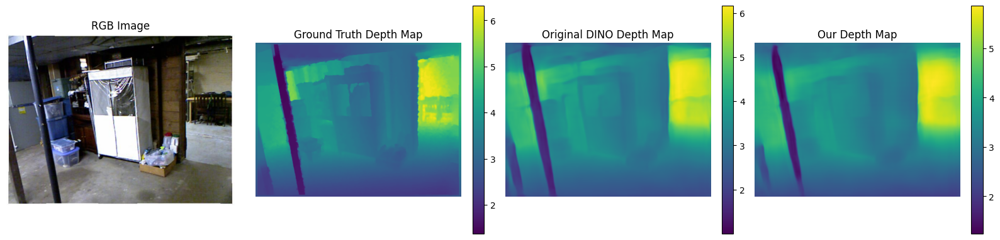

Our Pipeline Inference Time for Image 32 = 210.21017456054688 milliseconds (4.757143663909426 Hz)
Validation - End of Epoch 9, Image 32: Original MSE = 0.1129855215549469, Updated MSE = 0.09349211305379868


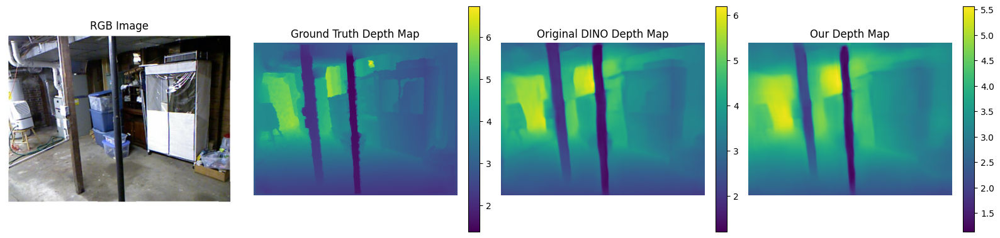

Our Pipeline Inference Time for Image 33 = 204.10572814941406 milliseconds (4.899421535430684 Hz)
Validation - End of Epoch 9, Image 33: Original MSE = 0.1430598646402359, Updated MSE = 0.10422452539205551


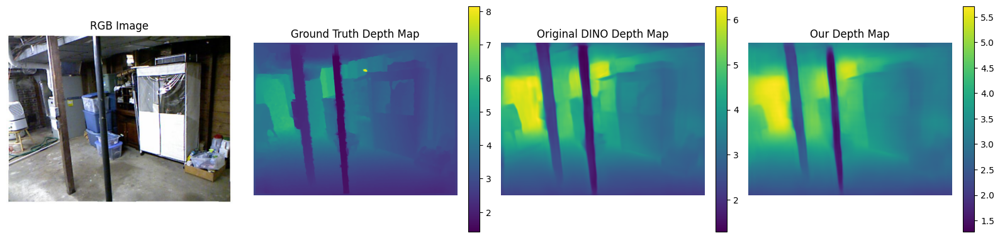

Our Pipeline Inference Time for Image 34 = 203.5811767578125 milliseconds (4.912045484389925 Hz)
Validation - End of Epoch 9, Image 34: Original MSE = 0.2569239139556885, Updated MSE = 0.163768008351326


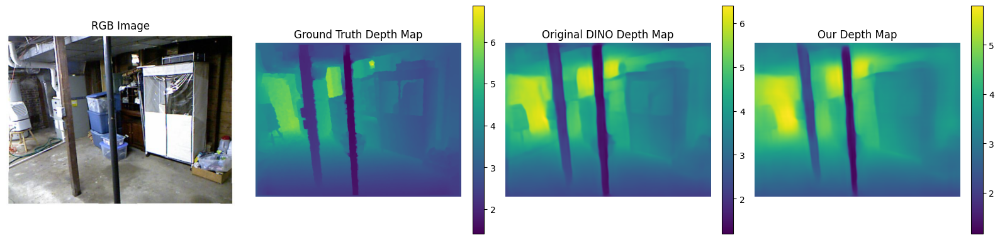

Our Pipeline Inference Time for Image 35 = 201.9614715576172 milliseconds (4.9514394616337105 Hz)
Validation - End of Epoch 9, Image 35: Original MSE = 0.2424975335597992, Updated MSE = 0.17331725358963013


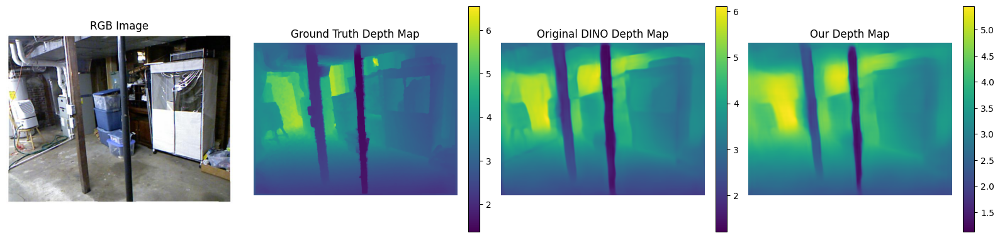

Our Pipeline Inference Time for Image 36 = 210.9799346923828 milliseconds (4.739787228856811 Hz)
Validation - End of Epoch 9, Image 36: Original MSE = 0.2049119621515274, Updated MSE = 0.13186509907245636


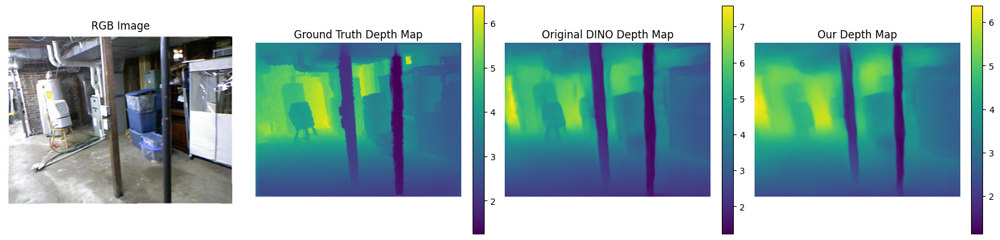

Our Pipeline Inference Time for Image 37 = 211.8832244873047 milliseconds (4.719580808814416 Hz)
Validation - End of Epoch 9, Image 37: Original MSE = 0.496011346578598, Updated MSE = 0.28053271770477295


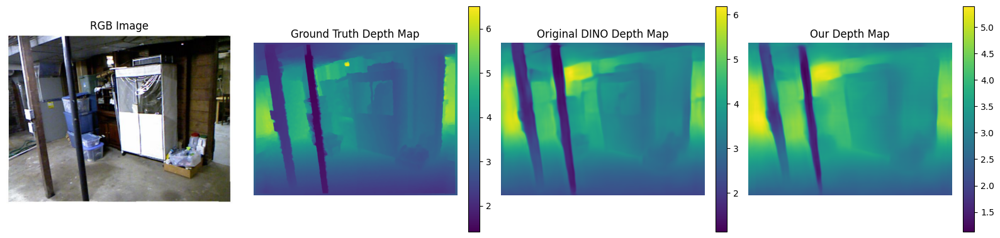

Our Pipeline Inference Time for Image 38 = 204.54806518554688 milliseconds (4.888826492164047 Hz)
Validation - End of Epoch 9, Image 38: Original MSE = 0.21802698075771332, Updated MSE = 0.16465319693088531


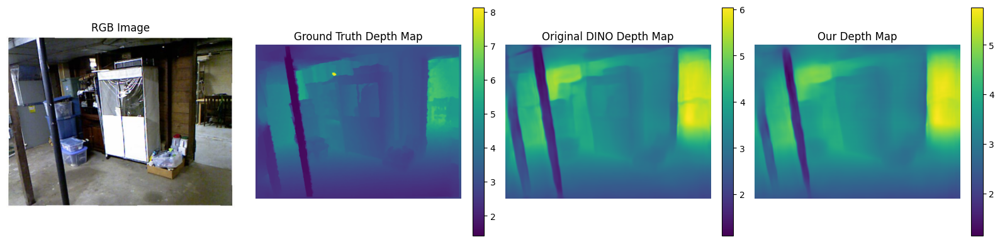

Our Pipeline Inference Time for Image 39 = 202.4160919189453 milliseconds (4.9403186798035605 Hz)
Validation - End of Epoch 9, Image 39: Original MSE = 0.15988756716251373, Updated MSE = 0.11885833740234375

Validation - End of Epoch 9: Original DINO Mean MSE over Validation set at Epoch 9 = 0.21091441810131073
Validation - End of Epoch 9: Our Pipeline Mean MSE over Validation set at Epoch 9 = 0.14700458943843842
Validation - End of Epoch 9: Mean Difference over Validation set at Epoch 9 = -0.06390982866287231

Average Inference Time for Our Pipeline = 207.5782741546631


In [8]:
%matplotlib inline

model_string = 'cnn_regularized' # in 'cnn', 'cnn_regularized'

epoch_to_load = 9 # epoch of training from which to load model (if loading model)
segment_to_load = None # set this to i+1 to load model from val_checkpoint_ratios[i] through selected epoch, set to None to load model from end of selected epoch

val_checkpoint_ratios = [0.25, 0.5, 0.75] # points in each epoch at which model was saved and could be reloaded from

backbone_size = "small" # in ("small", "base", "large", or "giant")
head_dataset = "nyu" # in ("nyu", "kitti")
head_type = "dpt" # in ("linear", "linear4", "dpt")

data_directory = './datasets'
filename_val = './val_list.json'

image_height = 480
image_width = 640

feature_height = 35
feature_width = 46

backbone_name, backbone_model = load_backbone(backbone_size=backbone_size)

model = load_dino_model(backbone_name, backbone_model, backbone_size=backbone_size, head_dataset=head_dataset, head_type=head_type)

with open(filename_val, 'r') as f:
    val_list = json.load(f)

val_list = [sample for sample in val_list if sample[1] > 1]

num_images_val = len(val_list)

transform = make_depth_transform()

print("Running Validation for " + model_string)

adapter_model = CNNModel(1, 1)
adapter_model.cuda()

if segment_to_load is None:
    adapter_model.load_state_dict(torch.load('./' + model_string + '_model_epoch_' + str(epoch_to_load) + '.pth', weights_only=True, map_location='cuda:0'))
else:
    adapter_model.load_state_dict(torch.load('./' + model_string + '_model_epoch_' + str(epoch_to_load) + '_segment_' + str(segment_to_load) + '.pth', weights_only=True, map_location='cuda:0'))

inference_times_milliseconds = []

original_mse_current_epoch_val_mean, updated_mse_current_epoch_val_mean = val_loop(val_list, data_directory, transform, model, adapter_model, image_height, image_width, feature_height, feature_width, num_images_val, 1, epoch_to_load, model_string, end_of_epoch=True)

print("\nAverage Inference Time for Our Pipeline = " + str(np.mean(np.array(inference_times_milliseconds))))